In [1]:
#Importing all necessary libraries.

import csv
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

In [2]:
#Reading data from the census csv file.

census_df = pd.read_csv("census20.csv")

In [3]:
#Getting an overview information of the dataset.

census_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8577 entries, 0 to 8576
Data columns (total 11 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   House Number                   8577 non-null   int64  
 1   Street                         8577 non-null   object 
 2   First Name                     8577 non-null   object 
 3   Surname                        8577 non-null   object 
 4   Age                            8577 non-null   float64
 5   Relationship to Head of House  8577 non-null   object 
 6   Marital Status                 6492 non-null   object 
 7   Gender                         8577 non-null   object 
 8   Occupation                     8577 non-null   object 
 9   Infirmity                      8577 non-null   object 
 10  Religion                       6445 non-null   object 
dtypes: float64(1), int64(1), object(9)
memory usage: 737.2+ KB


From the output above it can be found that there are 8577 entries with 11 columns that was read from the csv file. Two colums namely the Marital Status and Religion contains some missing values. Except from the Age column, every other columns are in the correct data type. Later in the review of each columns, the data type of the Age column would be changed from float to int.

In [4]:
#Retrieving information about non-null in the dataset.

census_df.isna().sum()

House Number                        0
Street                              0
First Name                          0
Surname                             0
Age                                 0
Relationship to Head of House       0
Marital Status                   2085
Gender                              0
Occupation                          0
Infirmity                           0
Religion                         2132
dtype: int64

The Marital Status and Religion columns have 2085 and 2132 null values respectively.

In [5]:
#Retrieving information about duplicate records in the dataset.

census_df.duplicated().sum()

0

There are no duplicate records in the dataset.

In [6]:
#Viewing the first 10 rows of the dataframe.

census_df.head(10)

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion
0,1,Turkey Gardens,Alexander,Macdonald,21.0,Head,Married,Male,Sports development officer,None,None
1,1,Turkey Gardens,Yvonne,Macdonald,19.0,Wife,Married,Female,University Student,None,None
2,2,Turkey Gardens,Louise,Taylor,38.0,Head,Divorced,Female,Mining engineer,None,Christian
3,2,Turkey Gardens,Philip,Harding,55.0,Visitor,Single,Male,Quarry manager,None,Christian
4,3,Turkey Gardens,Rachael,Evans,78.0,Head,Widowed,Female,Retired Freight forwarder,None,Christian
5,3,Turkey Gardens,Hugh,Evans,39.0,Son,Single,Male,"Pilot, airline",None,Christian
6,3,Turkey Gardens,Graham,Evans,38.0,Son,Divorced,Male,"Scientist, research (medical)",None,Christian
7,3,Turkey Gardens,Alexandra,Evans,38.0,Daughter,Single,Female,Administrator,None,None
8,3,Turkey Gardens,Holly,Evans,36.0,Daughter,Single,Female,Psychiatric nurse,None,Christian
9,4,Turkey Gardens,Martyn,Nicholson,34.0,Head,Single,Male,Hospital doctor,None,None


# Analyzing and rectifying each columns.

## House Number Column

In [7]:
#Checking the unique values of the House Number column.

census_df["House Number"].unique()

array([  1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,
        14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,
        27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,
        40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,
        53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,
        66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,
        79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,
        92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103, 104,
       105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117,
       118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130,
       131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143,
       144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156,
       157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169,
       170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 18

In [8]:
#Checking for missing value in the House Number column.

census_df[census_df["House Number"] == " "]

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion


There are empty missing values in the House Number column.

## Street Column

In [9]:
#Checking the unique values of the Street column.

census_df["Street"].unique()

array(['Turkey Gardens', 'Howarth Drive', 'Knight Greens', 'Ahmed Haven',
       'Summer Crescent', 'Dunn Spur', 'Barlow Pike', 'Charlton Avenue',
       'Steele Falls', 'Marsh Road', 'Aberdeen Knolls', 'Column Avenue',
       'Singh Forge', 'Polaris Crescent', 'Chemist Port', 'Webster Drive',
       'Wilson Forge', 'Haymarketbond Road', 'Chapman Trace',
       'Rosetap Road', 'Knight Corner', 'Silverpush Crescent',
       'Wilson Views', 'Faith Street', 'Clearwater Road', 'Allen Drive',
       'Parrot Crescent', 'Unitedpack Lane', 'Obelisk Orchard',
       'George Drive', 'Harvey Dale', 'Francis Field', 'Hughes Road',
       'Wales Crescent', 'Corporation Road', 'Edwards Points',
       'Stoke Harbors', 'Dundee Pass', 'Stationloom Street',
       'Coconut Keys', 'James Rapid', 'Goldfinch Avenue',
       'Aethelstan Pass', 'Penny Square', 'May Road', 'Ryan Greens',
       'Smith Divide', 'Wright Road', 'Unity Avenue',
       'Westminstertun Crescent', 'Cannon Groves', 'Snapdragon Drive

There are empty missing values in the House Number column.

## First Name Column

In [10]:
#Checking the unique values of the First Name column.

census_df["First Name"].unique()

array(['Alexander', 'Yvonne', 'Louise', 'Philip', 'Rachael', 'Hugh',
       'Graham', 'Alexandra', 'Holly', 'Martyn', 'Katie', 'Maureen',
       'Lucy', 'Sean', 'Christian', 'Georgina', 'Ben', 'Jill', 'Julia',
       'Gerard', 'Hilary', 'Bryan', 'Bethan', 'Rebecca', 'Jordan',
       'Naomi', 'Louis', 'Zoe', 'Joanna', 'Damien', 'Dominic', 'Cameron',
       'Henry', 'Kerry', 'James', 'Joe', 'Katy', 'Anna', 'Vanessa',
       'Pamela', 'Martin', 'Victor', 'Terry', 'Danny', 'Neil', 'Barry',
       'Kathryn', 'Julian', 'Lesley', 'Kate', 'Dean', 'Graeme',
       'Mitchell', 'Denise', 'Geoffrey', 'Mark', 'Emily', 'Thomas',
       'Steven', 'Harriet', 'Derek', 'Kelly', 'Robin', 'Maria', 'Craig',
       'Adam', 'Suzanne', 'Judith', 'Charlie', 'Josephine', 'Justin',
       'Kimberley', 'Georgia', 'Nathan', 'Jacqueline', 'Callum',
       'Patrick', 'Sian', 'Jodie', 'Jayne', 'Amelia', 'Lee', 'Jean',
       'Sylvia', 'Vincent', 'Stanley', 'Frank', 'Richard', 'Carol',
       'Geraldine', 'Douglas', '

In [11]:
#Checking if there is any missing value in the House Number column.

census_df[census_df["First Name"] == " "]

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion


There are empty missing values in the House Number column.

## Surname Column

In [12]:
#Checking the unique values of the First Name column.

census_df["Surname"].unique()

array(['Macdonald', 'Taylor', 'Harding', 'Evans', 'Nicholson', 'Pearson',
       'Williams-Evans', 'Thomas', 'Gibbs', 'Schofield', 'Martin',
       'Edwards', 'Ashton', 'Bennett', 'Fraser', 'Ahmed', 'Cooper',
       'Scott', 'James', 'Jackson', 'Perry', 'Kaur', 'Coates-Kaur',
       'Goodwin', 'Hughes', 'Thompson', 'Adams', 'Griffiths', 'Spencer',
       'Young', 'Dobson', 'Parkin', 'Wade', 'Smith', 'Jones', 'Brown',
       'Murray', 'Powell', 'Wright', 'Mason', 'Flynn', 'Chamberlain',
       'Lees-Ross', 'Williams-Davies', 'West', 'Doyle', 'Tucker', 'Pope',
       'Farmer', 'Cole', 'Read', 'Johnson', 'Bates', 'Riley', 'Wilkinson',
       'Hammond', 'Green', 'Humphries', 'Gardiner', 'Price', 'Wilson',
       'Craig', "O'Connor", 'Shaw', 'Clarke', 'Holden', 'Day', 'Ross',
       'Walker', 'Booth', 'Harrison', 'Fowler', 'Power', 'Williams',
       'Harvey', 'Grant', 'Blake', 'Arnold', 'Lawrence', 'Henry',
       'Roberts', 'Clements', 'Warner', 'Hill', 'Moss', 'Rogers',
       'Burton', 

In [13]:
#Checking if there is any missing value in the House Number column.

census_df[census_df["Surname"] == " "]

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion
5517,13,Whitehall Road,Ricky,,50.0,Husband,Married,Male,Magazine journalist,None,None


One record is missing in the Surname column.

In [14]:
#Retrieving records that satifies the following conditions from the data set:
    # Individuals that lives in House Number 13 and Whitehall Road Street.
#By getting records with the above condition would allows be able to see how the returned individuals relate to the Ricky, hence deciding his Surname.

census_df.loc[(census_df["House Number"] == 13) & 
              (census_df["Street"] == "Whitehall Road")]

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion
5516,13,Whitehall Road,Nicole,Nash,51.0,Head,Married,Female,"Designer, ceramics/pottery",None,None
5517,13,Whitehall Road,Ricky,,50.0,Husband,Married,Male,Magazine journalist,None,None


From the output, Ricky and Nicole are the only individual who resides in the specified address. Also, they are about the same age and different gender. They are both married. Hence, they fit the description that they are related. Therefore, I concluded that Ricky is the husband of Nicole and would assigned the Surname Nash to Ricky as Wives bare the same surname as their husbands.

In [15]:
#Assigning the value Nash to Ricky's Surname.

census_df.at[5517, "Surname"] = "Nash"

## Age Column

In [16]:
#Checking the unique values of the Age column.

census_df["Age"].unique()

array([ 21.        ,  19.        ,  38.        ,  55.        ,
        78.        ,  39.        ,  36.        ,  34.        ,
        32.        ,   9.        ,  50.        ,  54.        ,
        18.        ,  17.        ,  44.        ,  42.        ,
        23.        ,  20.        ,   3.        ,  58.        ,
        56.        ,  94.        ,  33.        ,  40.        ,
        25.        ,  22.        ,  24.        ,  67.        ,
        63.        ,   2.        ,   1.        ,  26.        ,
        52.        ,  71.        ,  43.        ,  27.        ,
        31.        ,  11.        ,   8.        ,   4.        ,
         7.        ,  51.        ,  14.        ,  57.        ,
        29.        ,  47.        ,  64.        ,  15.        ,
        79.        ,  60.        ,  59.        ,  12.        ,
        41.        ,  48.        ,  68.        ,  37.        ,
        53.        ,  10.        ,  28.        ,  35.        ,
        13.        ,  77.        ,  46.        ,   5.  

In [17]:
#Checking if there is any missing value in the Age column.

census_df[census_df["Age"] == " "]

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion


There are empty missing values in the Age column.

Earlier it was indicated that Age column is data type float and would be casted to int.

In [18]:
#Casting Age column data type to int.

census_df["Age"] = census_df["Age"].astype("int64")
census_df["Age"].unique()

array([ 21,  19,  38,  55,  78,  39,  36,  34,  32,   9,  50,  54,  18,
        17,  44,  42,  23,  20,   3,  58,  56,  94,  33,  40,  25,  22,
        24,  67,  63,   2,   1,  26,  52,  71,  43,  27,  31,  11,   8,
         4,   7,  51,  14,  57,  29,  47,  64,  15,  79,  60,  59,  12,
        41,  48,  68,  37,  53,  10,  28,  35,  13,  77,  46,   5,  75,
        45,  16,  69,  74,  66,  72,  62,  30,  49,  81,   0,  70,   6,
        84,  89,  87,  82,  85,  76,  73, 100,  80,  86,  61,  65,  91,
        96,  93,  83,  98, 104,  95, 103,  88,  90,  99, 102,  92,  97,
       105, 101, 107], dtype=int64)

## Age Pyramid

In [19]:
age_bins = list(range(0, census_df["Age"].max()+6, 5))

In [20]:
ageclass = [f"{i}-{j}" for i, j in zip(range(0, census_df["Age"].max()+1, 5), 
                                       range(4, census_df["Age"].max() + 6, 5))]

In [21]:
ageclass[-1] = "105+"

In [22]:
#Assigning each row to a distinct age band, add a new column using the pandas 'cut()' method.
census_df["Age Band"] = pd.cut(census_df["Age"], labels=ageclass, bins=age_bins, right=False)

In [23]:
#Adding an a column to split sex into Male and Female
census_df["Age Band Value"] = 1

In [24]:
# Sum the age counts by age_band and gender
census_ageband = census_df.groupby(["Age Band", "Gender"])["Age Band Value"].sum()

In [25]:
# Unstack the age_band count to create two columns, one for males and one for females
census_ageband = census_ageband.unstack()

In [26]:
# Rename the columns
census_ageband.columns = ["Number of Males (negative)", "Number of Females"]

In [27]:
#Multiply the age of Males with Minus one
census_ageband["Number of Males (negative)"] = census_ageband["Number of Males (negative)"] * -1

In [28]:
#Dropping Age_Band_Value column
census_df = census_df.drop("Age Band Value", axis=1)

In [29]:
#View of the 'census_age_band' dataframe
census_ageband.head(3)

,Number of Males (negative),Number of Females
Age Band,,
0-4,-245,244
5-9,-302,318
10-14,-318,291


In [30]:
#convert the category index 'Age_Band' to Pandas Dataframe
census_ageband = census_ageband.reset_index()

In [31]:
#View of the 'census_age_band' dataframe after the reseting the index above
census_ageband.head(3)

,Age Band,Number of Males (negative),Number of Females
0,0-4,-245,244
1,5-9,-302,318
2,10-14,-318,291


In [32]:
#sorting the table in descending order because they are class list above is in ascending order
#and to ensure that our population pyramid is not inverted
census_ageband.sort_values(by="Age Band",ascending=False, ignore_index=True, key=None).head(3)

,Age Band,Number of Males (negative),Number of Females
0,105+,-1,2
1,100-104,-3,6
2,95-99,-5,5


In [33]:
ageclass.reverse()

Text(0.5, 1.0, 'Age Pyramid')

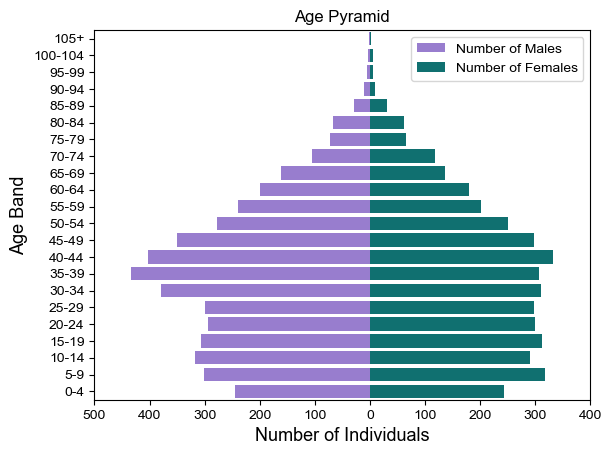

In [34]:
age_pyramid = sns.barplot(x="Number of Males (negative)", y="Age Band", data=census_ageband,
order=ageclass, color=("mediumpurple"), label="Number of Males")
age_pyramid = sns.barplot(x="Number of Females", y="Age Band", data=census_ageband,
order=ageclass, color=("teal"), label="Number of Females")
age_pyramid.legend()
sns.set(rc={"figure.figsize":(10, 8)}) #width=8, height=4
plt.xlabel("Number of Individuals",fontsize = 13)
plt.ylabel("Age Band",fontsize = 13)
xticks = plt.gca().get_xticks().astype(np.int64)
plt.xticks(xticks, labels = np.abs(xticks));
plt.title('Age Pyramid')

In [35]:
age_pyramid.get_figure().savefig("./age_pyramid")

In [36]:
#Checking for individuals who are below 18 and divorced or widowed or married.

find_list = ["Married", "Widowed", "Divorced"]

census_df.loc[(census_df["Age"] < 18) & (census_df["Marital Status"].isin(find_list))]

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion,Age Band


There are no individuals below the age of 18 that married or divorced or widowed.

In [37]:
"""Checking for individuals who are equal 18 and are married or divorced or widowed.
#Regardless of their occupation, as long as an 18 years old is eligible to marry by law then it is also possible 
to have an 18 years old divorcee and widow or widower."""

census_df.loc[(census_df["Age"] == 18) & (census_df["Marital Status"].isin(find_list))]

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion,Age Band
70,25,Turkey Gardens,Adam,Wade,18,Son,Divorced,Male,Student,None,Methodist,15-19
639,5,Marsh Road,Sheila,Williams,18,Head,Divorced,Female,Student,None,NaN,15-19
1000,92,Column Avenue,Diane,Pearson,18,Head,Married,Female,Student,None,NaN,15-19
1229,175,Column Avenue,Geoffrey,Sullivan,18,Head,Married,Male,Student,None,NaN,15-19
1308,21,Singh Forge,Gerald,Jordan,18,Son,Widowed,Male,Student,None,Catholic,15-19
1364,2,Polaris Crescent,Clive,Smith,18,Son,Divorced,Male,Student,None,None,15-19
1537,49,Polaris Crescent,Bethan,Robinson,18,Daughter,Divorced,Female,Student,None,None,15-19
3384,36,Harvey Dale,Sean,Bowen,18,Son,Divorced,Male,Student,None,None,15-19
3535,10,Hughes Road,Louis,Scott,18,Son,Divorced,Male,Student,None,None,15-19
3728,37,Wales Crescent,Jake,Connor,18,Head,Married,Male,Student,None,NaN,15-19


In [38]:
#Checking for individuals who are equal 18 and widowed.

census_df.loc[(census_df["Age"] == 18) & (census_df["Marital Status"] == "Widowed")]

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion,Age Band
1308,21,Singh Forge,Gerald,Jordan,18,Son,Widowed,Male,Student,None,Catholic,15-19
3843,30,Corporation Road,Sharon,Edwards,18,Head,Widowed,Female,Student,None,NaN,15-19
6095,5,Bishop Lane,Joe,Rogers,18,Son,Widowed,Male,Student,None,None,15-19


## Marital Status Column

In [39]:
census_df["Marital Status"].unique()

array(['Married', 'Divorced', 'Single', 'Widowed', nan], dtype=object)

In [40]:
#Retrieving the records individuals who are below 16 with null values indicated in their marital status.

census_df.loc[(census_df["Age"] < 16) & (census_df["Marital Status"].isna())]

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion,Age Band
11,4,Turkey Gardens,Maureen,Nicholson,9,Daughter,NaN,Female,Student,None,NaN,5-9
20,6,Turkey Gardens,Hilary,Thomas,3,Daughter,NaN,Female,Child,None,NaN,0-4
39,14,Turkey Gardens,Vanessa,Jackson,2,Daughter,NaN,Female,Child,None,NaN,0-4
40,14,Turkey Gardens,Pamela,Jackson,1,Daughter,NaN,Female,Child,None,NaN,0-4
52,18,Turkey Gardens,Graeme,Thompson,2,Son,NaN,Male,Child,None,NaN,0-4
...,...,...,...,...,...,...,...,...,...,...,...,...
8571,1,Simmons Delve,Jonathan,Goodwin,0,None,NaN,Male,Child,None,NaN,0-4
8573,1,Lomond Manor,Vincent,Newman,9,Son,NaN,Male,Student,None,NaN,5-9
8574,1,Lomond Manor,Louise,Butler-Newman,8,Daughter,NaN,Female,Student,None,NaN,5-9
8575,1,Lomond Manor,Trevor,Butler-Newman,4,Son,NaN,Male,Child,None,NaN,0-4


In [41]:
"""

By law marital status information for individuals below 16 years of age are not collected.
Hence, martial status for these individuals is set to "Not Applicable".

"""

census_df.loc[(census_df["Age"] < 16) & (census_df["Marital Status"].isna()), "Marital Status"] = "Minor"

In [42]:
#Retrieving the records individuals who are betweeen 16 and 17 with null values indicated in their marital status.

census_df.loc[((census_df["Age"] >15) & (census_df["Age"] <18)) & (census_df["Marital Status"].isna())]

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion,Age Band
15,5,Turkey Gardens,Georgina,Williams-Evans,17,Daughter,NaN,Female,Student,None,NaN,15-19
163,2,Howarth Drive,Amanda,Williams,16,Daughter,NaN,Female,Student,None,NaN,15-19
177,6,Howarth Drive,Steven,Arnold,17,Adopted Son,NaN,Male,Student,None,NaN,15-19
283,16,Summer Crescent,Kenneth,Jones,16,Son,NaN,Male,Student,None,NaN,15-19
310,25,Summer Crescent,Henry,Crawford,17,Son,NaN,Male,Student,None,NaN,15-19
...,...,...,...,...,...,...,...,...,...,...,...,...
8347,5,Kennedy Freeway,Alan,Barnes,17,Son,NaN,Male,Student,None,NaN,15-19
8376,16,Kennedy Freeway,Jack,Simmons,16,Son,NaN,Male,Student,None,NaN,15-19
8381,17,Kennedy Freeway,Lindsey,Jones,16,Daughter,NaN,Female,Student,None,NaN,15-19
8453,6,Albans Crescent,Brenda,Rowe,16,Daughter,NaN,Female,Student,None,NaN,15-19


In [43]:
"""

By law the age of marriage is 18 years old.
Therefore, the marital status of the all individuals whose age is between 16 and 17 would be set to Single.

"""
census_df.loc[((census_df["Age"] > 15) & census_df["Age"] < 18) & (census_df["Marital Status"].isna()), "Marital Status"] = "Single"

In [44]:
census_df.groupby('Marital Status')['Age'].describe()

,count,mean,std,min,25%,50%,75%,max
Marital Status,,,,,,,,
Divorced,753.0,41.019920,17.061945,18.0,28.00,37.0,51.0,105.0
Married,2602.0,50.122598,16.412689,18.0,38.00,48.0,62.0,107.0
Minor,1856.0,7.920797,4.447438,0.0,4.00,8.0,12.0,15.0
Single,3060.0,35.704575,13.961570,16.0,23.00,34.0,46.0,85.0
Widowed,306.0,65.418301,18.218929,18.0,61.25,69.0,77.0,103.0


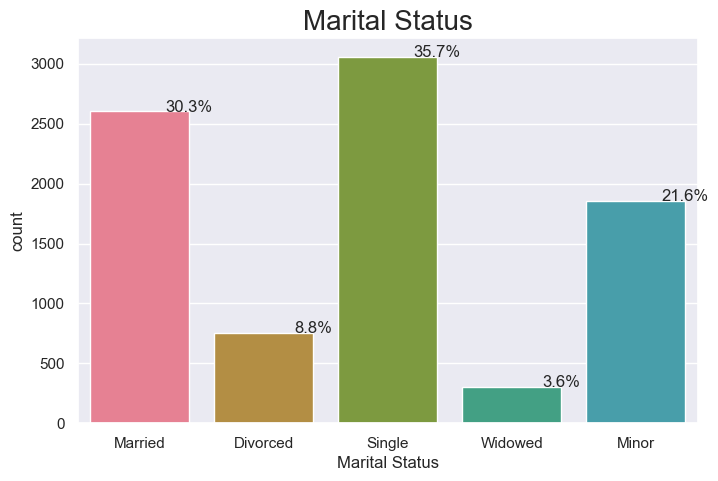

In [45]:
plt.figure(figsize=(8,5))
total = float(len(census_df))
ax = sns.countplot(x="Marital Status", data=census_df,palette= sns.color_palette("husl", 7))
plt.title('Marital Status', fontsize=20)
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height()/total)
    x = p.get_x() + p.get_width()
    y = p.get_height()
    ax.annotate(percentage, (x, y),ha='center')
plt.show()

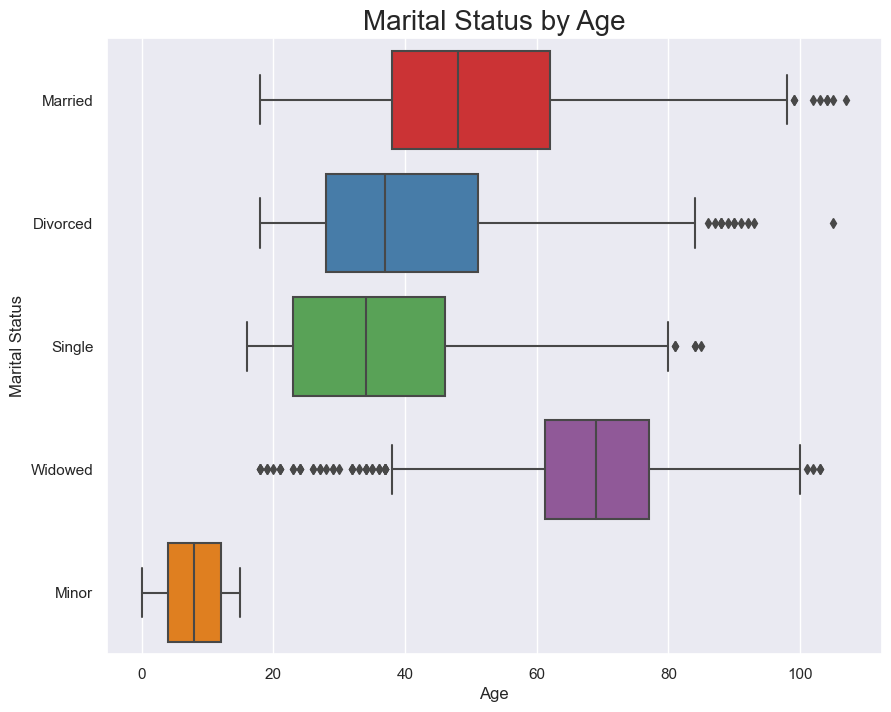

In [46]:
ax2 = sns.boxplot(x="Age", y="Marital Status", data=census_df,palette='Set1')
plt.title('Marital Status by Age', fontsize=20)
plt.show()

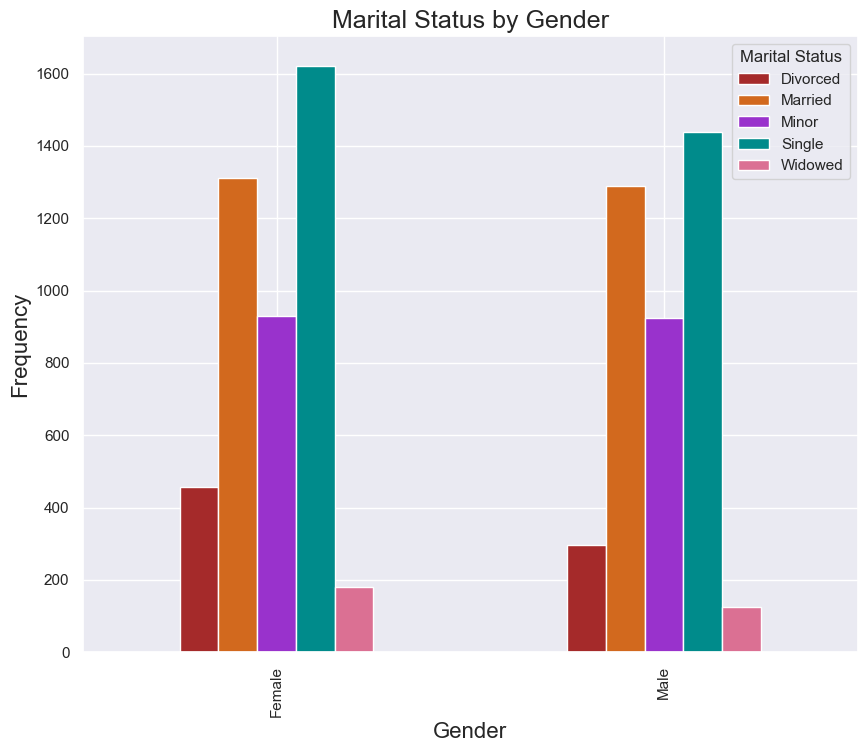

In [47]:
# Clustered bar chart of Gender and Marital Status

census_df.groupby(['Gender', 'Marital Status']).size().unstack().plot(kind = 'bar', color=['brown', 'chocolate', 'darkorchid', 'darkcyan', 'palevioletred'])

plt.xlabel('Gender', size = 16)

plt.ylabel('Frequency', size = 16)

plt.title('Marital Status by Gender', size = 18)

plt.savefig('Marital_status_by_gender.png')

plt.show()

In [48]:
ax.get_figure().savefig("./marital_status.png")
ax2.get_figure().savefig("./marital_status2.png")

## Gender Column

In [49]:
#Checking the unique values of the Gender column.

census_df["Gender"].unique()

array(['Male', 'Female'], dtype=object)

There are empty missing values in the Age column.

## Occupation Column

In [50]:
#Checking the unique values of the Occupation column.

census_df["Occupation"].unique()

array(['Sports development officer', 'University Student',
       'Mining engineer', ..., 'Retired Physicist, medical',
       'Retired Landscape architect', 'Retired Hospital pharmacist'],
      dtype=object)

In [51]:
#Checking if there is any missing value in the Gender column.

census_df[census_df["Occupation"].isna()]

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion,Age Band


In [52]:
#Checking if there is any missing value in the Gender column.

census_df[census_df["Occupation"] == " "]

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion,Age Band


In [53]:
census_df[census_df["Occupation"] == "None"]

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion,Age Band


## Infirmity Column

In [54]:
#Checking the unique values of the Infirmity column.

census_df["Infirmity"].unique()

array(['None', 'Deaf', 'Physical Disability', 'Unknown Infection',
       'Blind', 'Disabled', 'Mental Disability', ' '], dtype=object)

In [55]:
#Checking if there is any missing value in the Gender column.

census_df[census_df["Infirmity"] == " "]

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion,Age Band
1534,49,Polaris Crescent,Donna,Robinson,52,Head,Married,Female,Tax inspector,,Christian,50-54
3055,2,Obelisk Orchard,Lucy,Allen,41,Head,Single,Female,"Journalist, broadcasting",,None,40-44
3313,25,Harvey Dale,Robert,Parker,6,Son,Minor,Male,Student,,NaN,5-9
3639,14,Wales Crescent,Peter,Hall,4,Son,Minor,Male,Child,,NaN,0-4
4676,48,Parrot Crescent,Wendy,Phillips,2,Daughter,Minor,Female,Child,,NaN,0-4
4775,24,Smith Divide,Joanne,Gregory,61,Cousin,Single,Female,Geographical information systems officer,,Methodist,60-64
5398,42,Repton Drive,Marc,Jones,28,Husband,Married,Male,Freight forwarder,,None,25-29


The family members of all individuals with missing values in the Infirmity column was carefully analyzed to check for any possibility of infirmity due to heredity. From the output, it can concluded that no family member as any form of infirmity, hence, all missing values in the Infirmity column would be replaced with "None".

In [56]:
#Checking for individuals related to Donna Robinson for any possibilty biological inheritance of infirmity.

census_df.loc[(census_df["House Number"] == 49) & (census_df["Street"] == "Polaris Crescent") & (census_df["Surname"] == "Robinson")]

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion,Age Band
1534,49,Polaris Crescent,Donna,Robinson,52,Head,Married,Female,Tax inspector,,Christian,50-54
1535,49,Polaris Crescent,Dale,Robinson,58,Husband,Married,Male,"Teacher, primary school",None,None,55-59
1536,49,Polaris Crescent,Carole,Robinson,20,Daughter,Single,Female,University Student,None,Christian,20-24
1537,49,Polaris Crescent,Bethan,Robinson,18,Daughter,Divorced,Female,Student,None,None,15-19


In [57]:
#Checking for individuals related to Lucy Allen for any possibilty biological inheritance of infirmity.

census_df.loc[(census_df["House Number"] == 2) & (census_df["Street"] == "Obelisk Orchard") & (census_df["Surname"] == "Allen")]

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion,Age Band
3055,2,Obelisk Orchard,Lucy,Allen,41,Head,Single,Female,"Journalist, broadcasting",,None,40-44


In [58]:
#Checking for individuals related to Robert Parker for any possibilty biological inheritance of infirmity.

census_df.loc[(census_df["House Number"] == 25) & (census_df["Street"] == "Harvey Dale") & (census_df["Surname"] == "Parker")]

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion,Age Band
3306,25,Harvey Dale,Adam,Parker,26,Son,Single,Male,Occupational hygienist,None,None,25-29
3307,25,Harvey Dale,Damien,Parker,22,Son,Divorced,Male,University Student,None,None,20-24
3308,25,Harvey Dale,Antony,Parker,19,Son,Single,Male,University Student,None,None,15-19
3309,25,Harvey Dale,Gerald,Parker,16,Son,Single,Male,Student,None,NaN,15-19
3310,25,Harvey Dale,Janet,Parker,12,Daughter,Minor,Female,Student,None,NaN,10-14
3311,25,Harvey Dale,Robert,Parker,9,Son,Minor,Male,Student,None,NaN,5-9
3312,25,Harvey Dale,Jean,Parker,6,Daughter,Minor,Female,Student,None,NaN,5-9
3313,25,Harvey Dale,Robert,Parker,6,Son,Minor,Male,Student,,NaN,5-9


In [59]:
#Checking for individuals related to Peter Hall for any possibilty biological inheritance of infirmity.

census_df.loc[(census_df["House Number"] == 14) & (census_df["Street"] == "Wales Crescent") & (census_df["Surname"] == "Hall")]

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion,Age Band
3638,14,Wales Crescent,Annette,Hall,47,Head,Divorced,Female,Field seismologist,None,None,45-49
3639,14,Wales Crescent,Peter,Hall,4,Son,Minor,Male,Child,,NaN,0-4


In [60]:
#Checking for individuals related to Wendy Phillips for any possibilty biological inheritance of infirmity.

census_df.loc[(census_df["House Number"] == 48) & (census_df["Street"] == "Parrot Crescent") & (census_df["Surname"] == "Phillips")]

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion,Age Band
4674,48,Parrot Crescent,Kirsty,Phillips,40,Head,Single,Female,Legal secretary,None,Catholic,40-44
4675,48,Parrot Crescent,Christian,Phillips,6,Son,Minor,Male,Student,None,NaN,5-9
4676,48,Parrot Crescent,Wendy,Phillips,2,Daughter,Minor,Female,Child,,NaN,0-4


In [61]:
#Checking for individuals related to Joanne Gregory for any possibilty biological inheritance of infirmity.

census_df.loc[(census_df["House Number"] == 24) & (census_df["Street"] == "Smith Divide") & (census_df["Surname"] == "Gregory")]

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion,Age Band
4775,24,Smith Divide,Joanne,Gregory,61,Cousin,Single,Female,Geographical information systems officer,,Methodist,60-64


In [62]:
#Filling the missing records in the Infirmity column with None.

census_df["Infirmity"] = census_df["Infirmity"].replace(" ", "None")

## Relatinship to Head of House Column

In [63]:
census_df["Relationship to Head of House"].unique()

array(['Head', 'Wife', 'Visitor', 'Son', 'Daughter', 'Partner', 'Husband',
       'None', 'Lodger', 'Grandson', 'Adopted Son', 'Granddaughter',
       'Sibling', 'Step-Daughter', 'Adopted Daughter', 'Nephew',
       'Step-Son', 'Cousin', 'Neice', 'Son-in-law', ' ',
       'Adopted Granddaughter'], dtype=object)

In [64]:
#Checking if there is any missing value in the Relationship to Head of House column.

census_df[census_df["Relationship to Head of House"] == " "]

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion,Age Band
5348,21,Repton Drive,Gary,Fisher,16,,Single,Male,Student,None,NaN,15-19
8230,15,Potts Valley,Michael,Webb,18,,Divorced,Male,Student,None,None,15-19


In [65]:
#Checking for individuals related to Gary Fisher to determine their relationship to the head of house.


census_df.loc[(census_df["House Number"] == 21) & (census_df["Street"] == "Repton Drive") & (census_df["Surname"] == "Fisher")]

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion,Age Band
5346,21,Repton Drive,Anna,Fisher,55,Head,Single,Female,Unemployed,None,Christian,55-59
5348,21,Repton Drive,Gary,Fisher,16,,Single,Male,Student,None,NaN,15-19


In [66]:
#Gary Fisher is 16 years old, bears the same surname and resides at the same address with Anna Fisher who is 55 years old.
#This can only indicate that Gary is Anna'son.
#Changed Gary's Relationship to Head of House to Son.

census_df.loc[5348, "Relationship to Head of House"] = "Son"

In [67]:
#Checking for individuals related to Gary Fisher to determine their relationship to the head of house.

census_df.loc[(census_df["House Number"] == 15) & (census_df["Street"] == "Potts Valley") & (census_df["Surname"] == "Webb")]

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion,Age Band
8228,15,Potts Valley,Naomi,Webb,42,Head,Married,Female,Firefighter,None,Catholic,40-44
8229,15,Potts Valley,Justin,Webb,46,Husband,Married,Male,Unemployed,None,Catholic,45-49
8230,15,Potts Valley,Michael,Webb,18,,Divorced,Male,Student,None,None,15-19


In [68]:
#Naomi and Justin Webb are 42 and 46 years old respectively. From all indications it can be concluded that they are couples as they even practice the same religion. 
#Michael is divorced which legally possible as he is 18 years old. A student and resides with Naomi and Justin.
#We can conclude that he is a son in the household.
#Changed Michael's Relationship to Head of House to Son.

census_df.loc[8230, "Relationship to Head of House"] = "Son"

In [69]:
pd.set_option('display.max_rows', None)
census_df[census_df["Relationship to Head of House"] == "None"]

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion,Age Band
30,11,Turkey Gardens,Damien,Bennett,19,None,Single,Male,University Student,None,Methodist,15-19
31,11,Turkey Gardens,Dominic,Fraser,19,None,Single,Male,University Student,None,Catholic,15-19
32,11,Turkey Gardens,Cameron,Ahmed,25,None,Single,Male,PhD Student,None,None,25-29
33,11,Turkey Gardens,Henry,Cooper,32,None,Single,Male,PhD Student,None,None,30-34
78,29,Turkey Gardens,Georgia,Powell,22,None,Single,Female,University Student,None,Christian,20-24
79,29,Turkey Gardens,Louise,Wright,21,None,Single,Female,University Student,None,None,20-24
80,29,Turkey Gardens,Nathan,Mason,18,None,Single,Male,University Student,None,Methodist,15-19
92,35,Turkey Gardens,Sylvia,Tucker,54,None,Married,Female,Museum/gallery curator,None,None,50-54
93,35,Turkey Gardens,Vincent,Tucker,60,None,Married,Male,Sports administrator,None,None,60-64
111,41,Turkey Gardens,Mohammed,Wilkinson,20,None,Single,Male,University Student,None,None,20-24


In [70]:
census_df.loc[(census_df["House Number"] == 19) & (census_df["Street"] == "Albans Crescent") & (census_df["Surname"] == "Hurst")]

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion,Age Band
8491,19,Albans Crescent,Iain,Hurst,61,None,Single,Male,"Designer, ceramics/pottery",None,Jewish,60-64


In [71]:
census_df.loc[(census_df["Relationship to Head of House"] == "None") & (census_df["Age"] < 18)]

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion,Age Band
1025,100,Column Avenue,Donna,Arnold,10,None,Minor,Female,Student,None,NaN,10-14
2956,4,Allen Drive,Rosemary,Baker,11,None,Minor,Female,Student,None,NaN,10-14
4878,6,Unity Avenue,Gordon,Lee,6,None,Minor,Male,Student,None,NaN,5-9
4879,6,Unity Avenue,Bradley,Lee,5,None,Minor,Male,Student,None,NaN,5-9
8134,40,Lees Drive,Neil,Harris,17,None,Single,Male,Student,None,NaN,15-19
8571,1,Simmons Delve,Jonathan,Goodwin,0,None,Minor,Male,Child,None,NaN,0-4


In [72]:
# Individuals at these rows are related.

census_df.loc[1022:1025, "Relationship to Head of House"] = ["Wife", "Head", "Daughter", "Daughter"]

In [73]:
# Individuals at these rows are related.

census_df.loc[92:93, "Relationship to Head of House"] = ["Wife", "Head"]

In [74]:
census_df.loc[2954:2956, "Relationship to Head of House"] = ["Head", "Husband", "Daughter"]

In [75]:
census_df.loc[4876:4879, "Relationship to Head of House"] = ["Wife", "Head", "Son", "Son"]

In [76]:
census_df.loc[8132:8134, "Relationship to Head of House"] = ["Wife", "Head", "Son"]

In [77]:
census_df.loc[8569:8571, "Relationship to Head of House"] = ["Wife", "Head", "Son"]

In [78]:
len(census_df[census_df["Relationship to Head of House"] == "None"])

581

In [79]:
census_df.loc[(census_df["Relationship to Head of House"] == "None") & (census_df["Age"] < 18)]

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion,Age Band


In [80]:
census_df.loc[(census_df["Relationship to Head of House"] == "None") & (census_df["Age"] == 18)]

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion,Age Band
80,29,Turkey Gardens,Nathan,Mason,18,None,Single,Male,University Student,None,Methodist,15-19
491,21,Barlow Pike,Maurice,Davison,18,None,Single,Male,Student,None,NaN,15-19
515,30,Barlow Pike,Stuart,Price,18,None,Single,Male,University Student,None,Methodist,15-19
576,45,Barlow Pike,Scott,Power,18,None,Single,Male,Student,None,NaN,15-19
580,46,Barlow Pike,Jessica,Dunn,18,None,Single,Female,University Student,None,None,15-19
1179,158,Column Avenue,Brenda,Greenwood,18,None,Single,Female,Student,None,NaN,15-19
1546,51,Polaris Crescent,Bethan,Morris,18,None,Single,Female,Student,None,NaN,15-19
2051,4,Wilson Views,Bethany,Houghton,18,None,Single,Female,Student,None,NaN,15-19
2224,6,Faith Street,Hugh,Farmer,18,None,Single,Male,Student,None,NaN,15-19
2942,19,Clearwater Road,Scott,Robinson,18,None,Single,Male,Student,None,NaN,15-19


In [81]:
len(census_df.loc[(census_df["Relationship to Head of House"] == "None") & (census_df["Age"] > 18)])

559

In [82]:
census_df.loc[(census_df["Relationship to Head of House"] == "None") & (census_df["Age"] > 18)]

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion,Age Band
30,11,Turkey Gardens,Damien,Bennett,19,None,Single,Male,University Student,None,Methodist,15-19
31,11,Turkey Gardens,Dominic,Fraser,19,None,Single,Male,University Student,None,Catholic,15-19
32,11,Turkey Gardens,Cameron,Ahmed,25,None,Single,Male,PhD Student,None,None,25-29
33,11,Turkey Gardens,Henry,Cooper,32,None,Single,Male,PhD Student,None,None,30-34
78,29,Turkey Gardens,Georgia,Powell,22,None,Single,Female,University Student,None,Christian,20-24
79,29,Turkey Gardens,Louise,Wright,21,None,Single,Female,University Student,None,None,20-24
111,41,Turkey Gardens,Mohammed,Wilkinson,20,None,Single,Male,University Student,None,None,20-24
112,41,Turkey Gardens,Lindsey,Hammond,22,None,Single,Female,University Student,None,Christian,20-24
113,41,Turkey Gardens,Dorothy,Adams,19,None,Single,Female,University Student,None,Catholic,15-19
171,5,Howarth Drive,John,West,25,None,Single,Male,Health service manager,None,Christian,25-29


In [83]:
census_df.loc[(census_df["House Number"] == 46) & (census_df["Street"] == "Barlow Pike")] #& (census_df["Surname"] == "Price")]
#census_df[census_df["Surname"] == "Greenwood"]

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion,Age Band
577,46,Barlow Pike,Conor,Phillips,21,Head,Single,Male,University Student,None,Methodist,20-24
578,46,Barlow Pike,Gordon,Lee,32,None,Single,Male,PhD Student,None,Christian,30-34
579,46,Barlow Pike,Kimberley,Farmer,20,None,Single,Female,University Student,None,None,20-24
580,46,Barlow Pike,Jessica,Dunn,18,None,Single,Female,University Student,None,None,15-19
581,46,Barlow Pike,Brandon,Parkes,21,None,Single,Male,University Student,None,Christian,20-24
582,46,Barlow Pike,Olivia,Cole,32,None,Single,Female,PhD Student,None,None,30-34
583,46,Barlow Pike,Billy,Parkinson,20,None,Single,Male,University Student,None,None,20-24


In [84]:
census_df.loc[(census_df["Surname"] == "Houghton")]

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion,Age Band
1981,37,Rosetap Road,Kayleigh,Houghton,28,Head,Single,Female,Police officer,None,None,25-29
2051,4,Wilson Views,Bethany,Houghton,18,None,Single,Female,Student,None,NaN,15-19
4934,1,Westminstertun Crescent,Lindsey,Houghton,33,Head,Married,Female,Technical sales engineer,None,Christian,30-34
4935,1,Westminstertun Crescent,Joel,Houghton,33,Husband,Married,Male,Sports development officer,None,Christian,30-34
4936,1,Westminstertun Crescent,Terry,Houghton,5,Son,Minor,Male,Student,None,NaN,5-9
4937,1,Westminstertun Crescent,Harry,Houghton,0,Son,Minor,Male,Child,None,NaN,0-4
7655,53,Windy Skyway,Patricia,Houghton,38,Head,Married,Female,Equality and diversity officer,None,None,35-39
7656,53,Windy Skyway,James,Houghton,40,Husband,Married,Male,Sub,None,None,40-44
8470,12,Albans Crescent,Glen,Houghton,55,Head,Single,Male,Research scientist (medical),None,Christian,55-59


In [85]:
census_df["Relationship to Head of House"] = census_df["Relationship to Head of House"].replace("None", "Lodger")

## Religion Column

In [86]:
census_df["Religion"].unique()

array(['None', 'Christian', nan, 'Methodist', 'Catholic', 'Jewish',
       'Muslim', 'Sikh', 'Undecided', 'Sith', 'Hindu', 'Buddist',
       'Baptist', 'Bahai', ' '], dtype=object)

In [87]:
census_df.loc[(census_df["House Number"] == 45) & (census_df["Street"] == "Potts Valley") & (census_df["Surname"] == "Vaughan")]

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion,Age Band
8325,45,Potts Valley,Amy,Vaughan,43,Head,Single,Female,Dramatherapist,None,,40-44
8326,45,Potts Valley,Francis,Vaughan,10,Nephew,Minor,Male,Student,None,NaN,10-14


In [88]:
census_df[census_df["Religion"].isna() & (census_df["Age"] >= 16)]

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion,Age Band
15,5,Turkey Gardens,Georgina,Williams-Evans,17,Daughter,Single,Female,Student,None,NaN,15-19
163,2,Howarth Drive,Amanda,Williams,16,Daughter,Single,Female,Student,None,NaN,15-19
177,6,Howarth Drive,Steven,Arnold,17,Adopted Son,Single,Male,Student,None,NaN,15-19
203,2,Ahmed Haven,Jason,Dodd,19,Lodger,Single,Male,University Student,None,NaN,15-19
283,16,Summer Crescent,Kenneth,Jones,16,Son,Single,Male,Student,None,NaN,15-19
310,25,Summer Crescent,Henry,Crawford,17,Son,Single,Male,Student,None,NaN,15-19
437,8,Barlow Pike,Tom,Bell,17,Grandson,Single,Male,Student,None,NaN,15-19
448,11,Barlow Pike,Melanie,Berry,17,Daughter,Single,Female,Student,None,NaN,15-19
473,17,Barlow Pike,Sam,Jenkins,18,Sibling,Single,Male,Student,None,NaN,15-19
478,18,Barlow Pike,Dominic,Thompson,16,Son,Single,Male,Student,None,NaN,15-19


In [89]:
len(census_df[(census_df["Religion"].isna()) & (census_df["Age"] < 16)])

1856

In [90]:
census_df.loc[(census_df["House Number"] == 44) & (census_df["Street"] == "Turkey Gardens") & (census_df["Surname"] == "Gardiner")]

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion,Age Band
119,44,Turkey Gardens,Marie,Gardiner,52,Head,Married,Female,Multimedia programmer,None,Christian,50-54
120,44,Turkey Gardens,Ryan,Gardiner,53,Husband,Married,Male,Building surveyor,None,Christian,50-54
121,44,Turkey Gardens,Hilary,Gardiner,14,Daughter,Minor,Female,Student,None,NaN,10-14


In [91]:
len(census_df[census_df["Age"] < 16])

1856

In [92]:
census_df.loc[((census_df["Religion"] == " ") | (census_df["Religion"] == "NaN") | (census_df["Religion"] == "None")) & (census_df["Age"] >16)]

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion,Age Band
0,1,Turkey Gardens,Alexander,Macdonald,21,Head,Married,Male,Sports development officer,None,None,20-24
1,1,Turkey Gardens,Yvonne,Macdonald,19,Wife,Married,Female,University Student,None,None,15-19
7,3,Turkey Gardens,Alexandra,Evans,38,Daughter,Single,Female,Administrator,None,None,35-39
9,4,Turkey Gardens,Martyn,Nicholson,34,Head,Single,Male,Hospital doctor,None,None,30-34
10,4,Turkey Gardens,Katie,Pearson,32,Partner,Single,Female,Mental health nurse,None,None,30-34
21,7,Turkey Gardens,Bryan,Gibbs,58,Head,Married,Male,IT consultant,None,None,55-59
22,7,Turkey Gardens,Bethan,Gibbs,56,Wife,Married,Female,Mechanical engineer,None,None,55-59
23,7,Turkey Gardens,Rebecca,Gibbs,34,Daughter,Single,Female,Land,None,None,30-34
24,7,Turkey Gardens,Rachael,Gibbs,32,Daughter,Divorced,Female,Personal assistant,None,None,30-34
26,9,Turkey Gardens,Naomi,Martin,36,Head,Married,Female,"Investment banker, operational",None,None,35-39


In [93]:
#Amy Vaughan is 43 years and head of house, hence, it can be concluded that she is old enough to abstain from declaring her religion.
#Replacing Amy Vaughan's religion with no response.

census_df["Religion"] = census_df["Religion"].replace(" ", "No Religion")

In [94]:
census_df[census_df["Religion"] == "Sith"]

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion,Age Band
2326,38,Faith Street,Alice,Perry,23,Lodger,Single,Female,Electronics engineer,None,Sith,20-24
3499,17,Francis Field,Shirley,Smith,29,Head,Single,Female,"Therapist, speech and language",None,Sith,25-29


In [95]:
#Sith is a fictional order used in the fictional universe of the Star Wars franchise.
#Replacing Sith with No Religion.

census_df["Religion"] = census_df["Religion"].replace("Sith", 'No Religion')

In [96]:
#For individual with a value of None in their Religion record.
#It is safe to conclude that they have no religion since there is no one less than 18 as they have the right to be an atheist.

census_df['Religion'] = census_df['Religion'].replace('None', 'No Religion')

In [97]:
census_df['Religion'].fillna("Undecided", inplace=True) 

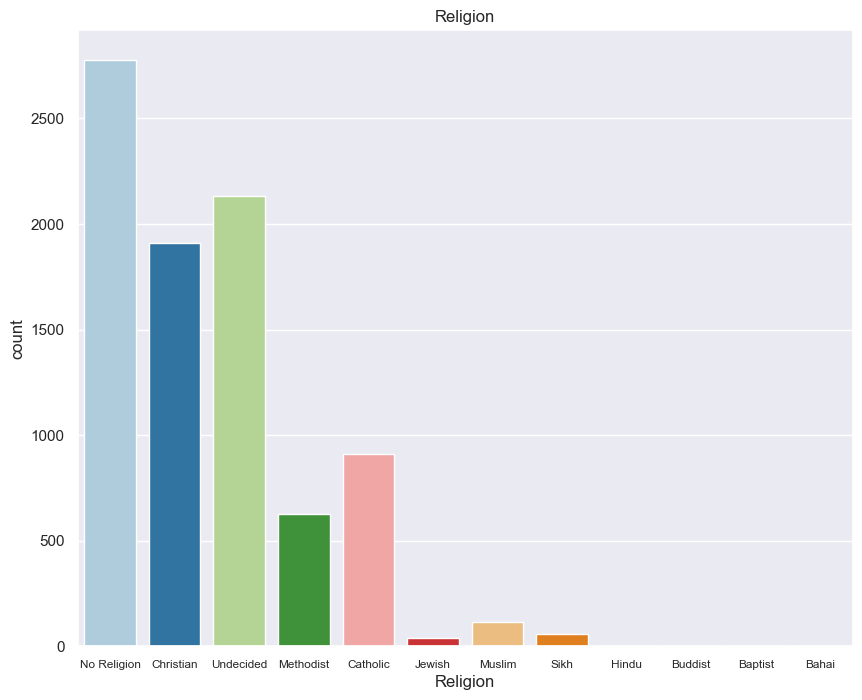

In [98]:
religion_plt = sns.countplot(data=census_df, x = 'Religion', palette='Paired');
religion_plt.set_xticklabels(religion_plt.get_xticklabels(), fontsize=8.5)
plt.title("Religion");
plt.show()

In [99]:
religion_plt.get_figure().savefig("./religion_plt")

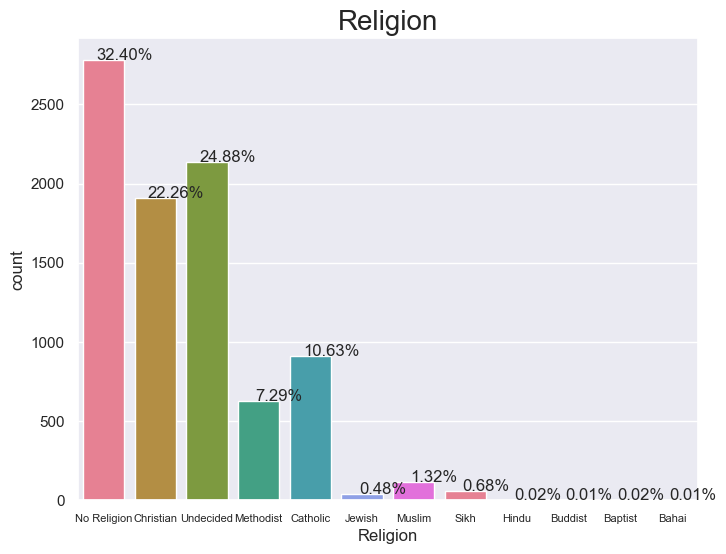

In [100]:
plt.figure(figsize=(8,6))
total = float(len(census_df))
religious_plt2 = sns.countplot(x="Religion", data=census_df,palette= sns.color_palette("husl", 7))
plt.title('Religion', fontsize=20)
for p in religious_plt2.patches:
    percentage = '{:.2f}%'.format(100 * p.get_height()/total)
    x = p.get_x() + p.get_width()
    y = p.get_height()
    religious_plt2.annotate(percentage, (x, y),ha='center')
religious_plt2.set_xticklabels(religious_plt2.get_xticklabels(), fontsize=8)
plt.savefig('religious_2_plt.png')
plt.show()


#There is no demand for a second Church or a different religious building

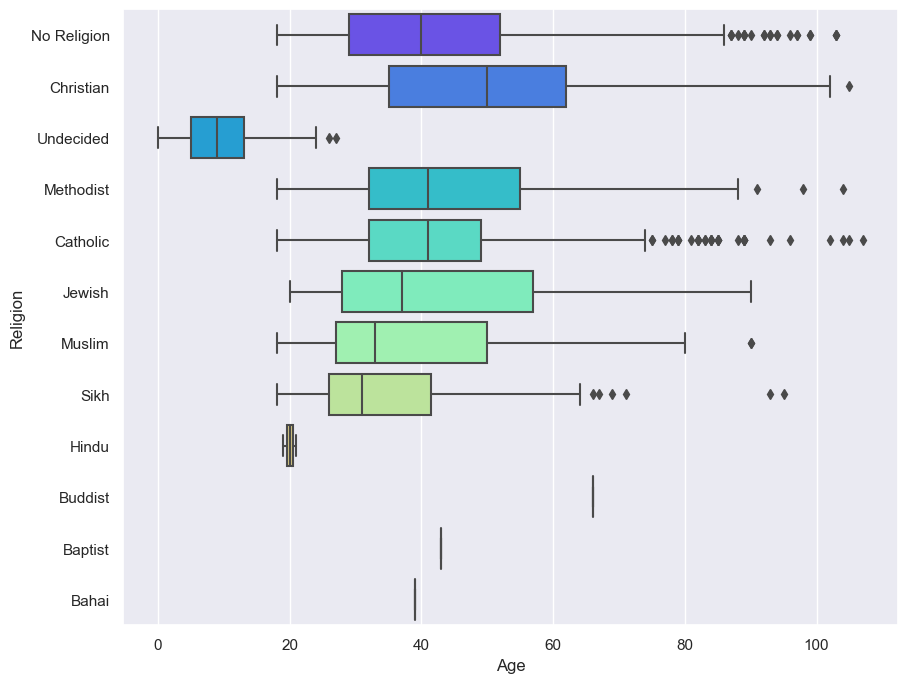

In [101]:
sns.boxplot(x="Age", y="Religion", data=census_df,palette='rainbow')
#plt.title('Religious Affiliation', fontsize=20)
plt.savefig('religious_age_plt.png')
plt.show()

<Figure size 1000x800 with 0 Axes>

<Figure size 1000x800 with 0 Axes>

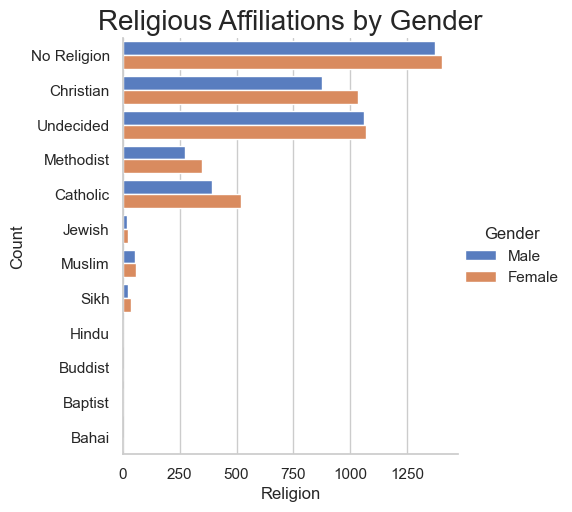

In [102]:
plt.figure(figsize=(10, 8))
with sns.axes_style('whitegrid'):
    plt.figure(figsize=(10, 8))
    sns.catplot(y='Religion', hue='Gender', data=census_df, kind='count', palette='muted')
    plt.title('Religious Affiliations by Gender', fontsize=20)
    plt.xlabel('Religion', fontsize=12)
    plt.ylabel('Count', fontsize=12)

plt.savefig('religious_gender_plt.png')
plt.show()

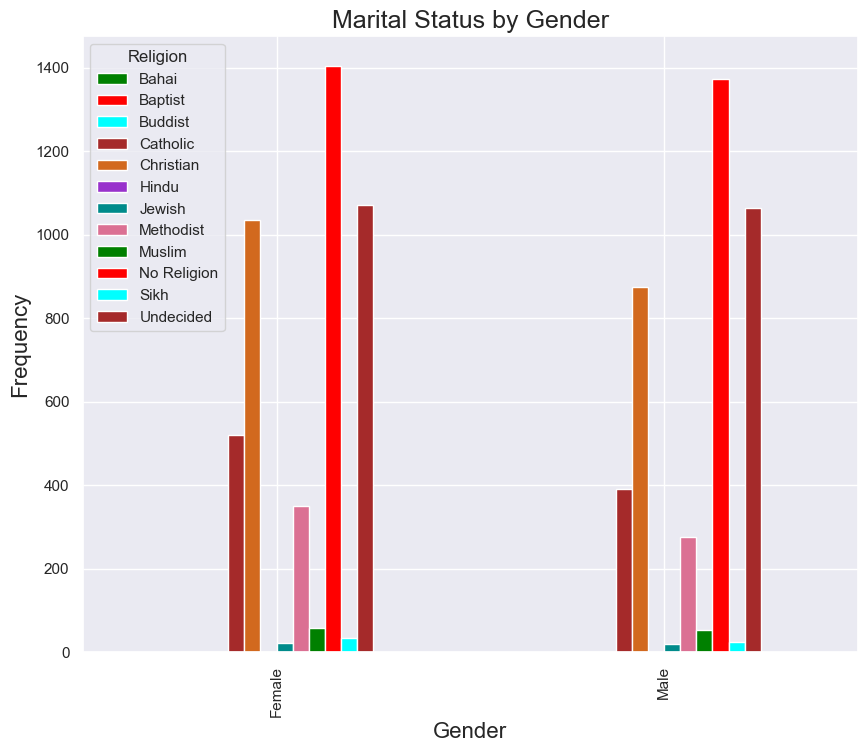

In [103]:
# Clustered bar chart of Gender and Religion.

census_df.groupby(['Gender', 'Religion']).size().unstack().plot(kind = 'bar', color=["Green", "red", "cyan",'brown', 'chocolate', 'darkorchid', 'darkcyan', 'palevioletred'])

plt.xlabel('Gender', size = 16)

plt.ylabel('Frequency', size = 16)

plt.title('Marital Status by Gender', size = 18)

plt.savefig('Marital_status_by_gender.png')



plt.show()

## Analyzing the Commutters

In [104]:
census_df["Employment_Class"] = ""

In [105]:
census_df.loc[census_df.Occupation == "Unemployed", "Employment_Class"] = "Unemployed"

In [106]:
census_df.loc[census_df.Occupation == 'Child', 'Employment_Class'] = "Child"

In [107]:
#updating the employment status 
census_df.loc[(census_df["Occupation"] == "Unemployed") 
                      & (census_df["Age"] > 65),"Employment_Class" ] = "Retired"

In [108]:
census_df.loc[census_df.Occupation.str.contains("Retired"), "Employment_Class"] = "Retired"

In [109]:
#https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.Series.str.contains.html
census_df.loc[census_df.Occupation.str.contains("University Student"), "Employment_Class"] = "University Student"

In [110]:
#https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.Series.str.contains.html
census_df.loc[census_df.Occupation.str.startswith("Student"), "Employment_Class"] = "Student"

In [111]:
census_df.loc[census_df.Occupation.str.contains("PhD Student"), "Employment_Class"] = "University Student"

In [112]:
census_df.loc[census_df.Employment_Class == "", "Employment_Class"] = "Employed"

In [113]:
census_df[census_df["Employment_Class"] == "Employed"]

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion,Age Band,Employment_Class
0,1,Turkey Gardens,Alexander,Macdonald,21,Head,Married,Male,Sports development officer,None,No Religion,20-24,Employed
2,2,Turkey Gardens,Louise,Taylor,38,Head,Divorced,Female,Mining engineer,None,Christian,35-39,Employed
3,2,Turkey Gardens,Philip,Harding,55,Visitor,Single,Male,Quarry manager,None,Christian,55-59,Employed
5,3,Turkey Gardens,Hugh,Evans,39,Son,Single,Male,"Pilot, airline",None,Christian,35-39,Employed
6,3,Turkey Gardens,Graham,Evans,38,Son,Divorced,Male,"Scientist, research (medical)",None,Christian,35-39,Employed
7,3,Turkey Gardens,Alexandra,Evans,38,Daughter,Single,Female,Administrator,None,No Religion,35-39,Employed
8,3,Turkey Gardens,Holly,Evans,36,Daughter,Single,Female,Psychiatric nurse,None,Christian,35-39,Employed
9,4,Turkey Gardens,Martyn,Nicholson,34,Head,Single,Male,Hospital doctor,None,No Religion,30-34,Employed
10,4,Turkey Gardens,Katie,Pearson,32,Partner,Single,Female,Mental health nurse,None,No Religion,30-34,Employed
12,5,Turkey Gardens,Lucy,Williams-Evans,50,Head,Married,Female,"Designer, jewellery",None,Methodist,50-54,Employed


In [114]:
"""

With the information available, there is no means to accurately retrieve the number of commuters.
However, the following assumptions would be made in addition to the known fact that University students......
are commuters as there is no University in the town:
1) Atleast 70% of employed individuals commute to either of the two big cities for work.
2) Individuals with all forms of infirmities have to go the cities for special care once in a while.
3) Other religions excluding those classified as Undecided and No Religion.....
    have to go out of the town for worship as only catholics have a place of worship in the town.

"""

no_of_employed_commuters = census_df[
    census_df["Employment_Class"] == "Employed"]["Employment_Class"].count() * (70/100)

no_of_unistudent_commuters = census_df[
    census_df["Employment_Class"] == 'University Student']["Employment_Class"].count()

no_of_infirmity_commuters = census_df[(census_df["Infirmity"] != "None") & 
                                      (census_df["Employment_Class"] != "Employed") 
                                      & (census_df["Employment_Class"] != "University Student")]["Employment_Class"].count()

no_of_religious_commuters = census_df[(census_df["Religion"] != "Catholic") & (census_df["Religion"] != "Undecided") 
          & (census_df["Religion"] != "No Religion") 
          & (census_df["Employment_Class"] != "Employed") & (census_df["Employment_Class"] != "University Student")
        & (census_df["Infirmity"] == "None")]["Religion"].count()

total_no_commuters = int(round((no_of_employed_commuters + no_of_unistudent_commuters + no_of_infirmity_commuters + no_of_religious_commuters), 0))

In [116]:
total_no_commuters

4469

In [117]:
commuters_percentage = (total_no_commuters/census_df["Employment_Class"].count()) *100

In [118]:
print( f"Percentage of commuters: {round(commuters_percentage)}%" )

Percentage of commuters: 52%


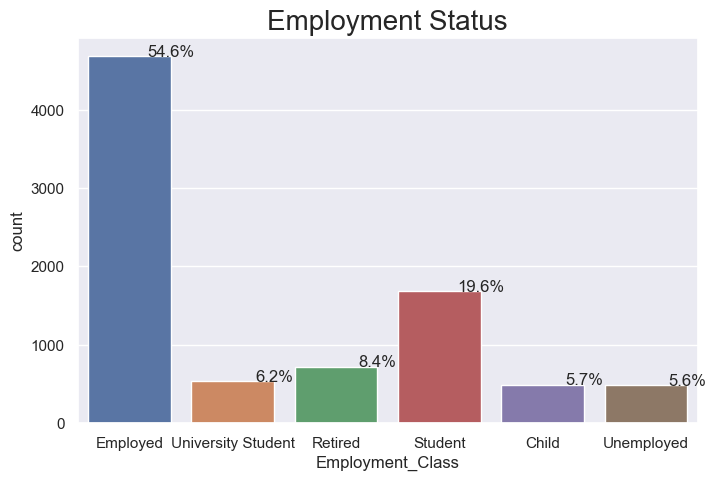

In [119]:
plt.figure(figsize=(8,5))
total = float(len(census_df))
employment_plot = sns.countplot(x="Employment_Class", data=census_df)
plt.title("Employment Status", fontsize=20)
for i in employment_plot.patches:
    percentage = "{:.1f}%".format(100 * i.get_height()/total)
    x = i.get_x() + i.get_width()
    y = i.get_height()
    employment_plot.annotate(percentage, (x, y),ha="center")
plt.show()

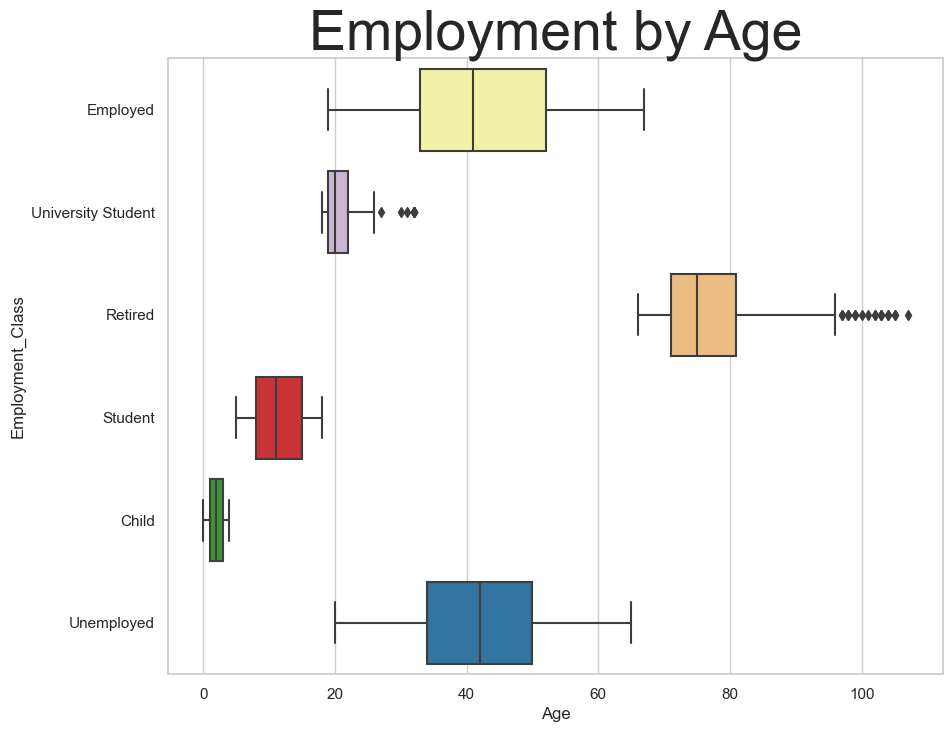

In [159]:
#color palette https://www.geeksforgeeks.org/how-to-use-seaborn-color-palette-to-color-boxplot/
sns.boxplot(x="Age", y="Employment_Class", data=census_df,palette="Paired_r")
plt.title("Employment by Age", fontsize=40)
plt.savefig('employment_age_plt.png')
plt.show()

## Unemployment Trend

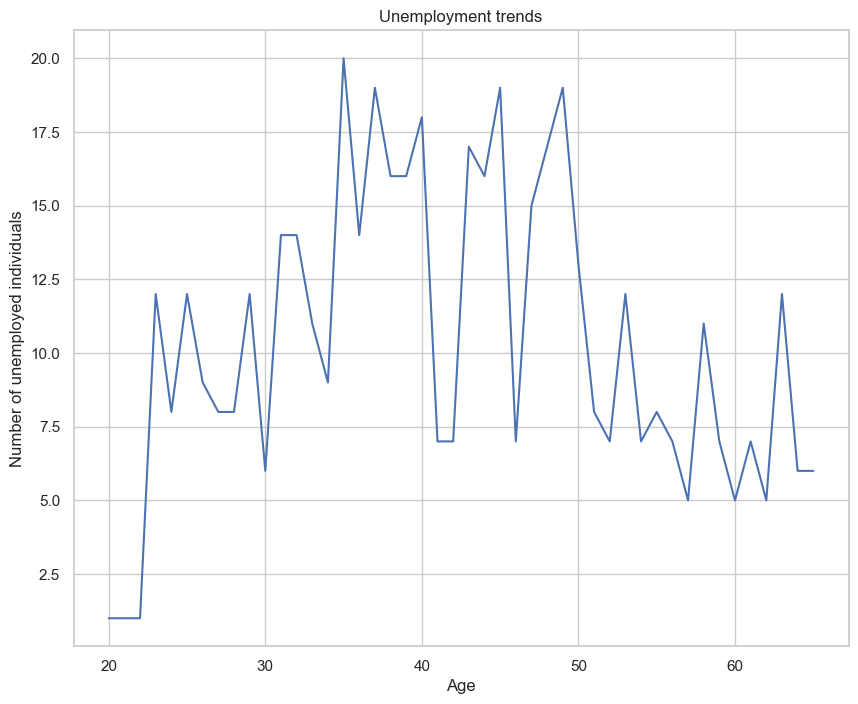

In [161]:
# Filter the data to include only unemployed individuals
unemployment_df = census_df.loc[(census_df["Employment_Class"] == "Unemployed")]

# Group the data by age and count the number of unemployed individuals
unemployment_by_age = unemployment_df.groupby("Age").size()

# Create a line plot to show the trend in unemployment
plt.plot(unemployment_by_age.index, unemployment_by_age.values)
plt.xlabel("Age")
plt.ylabel("Number of unemployed individuals")
plt.title("Unemployment trends")
plt.savefig('unemployment_trend_plt.png')
plt.show()

In [122]:
age_band_count = unemployment_df.groupby('Age Band')['Age Band'].count()
age_band_high = age_band_count.idxmax()
print(f"The ages that are more likely to be unemployed  : {(age_band_high)}")

The ages that are more likely to be unemployed  : 35-39


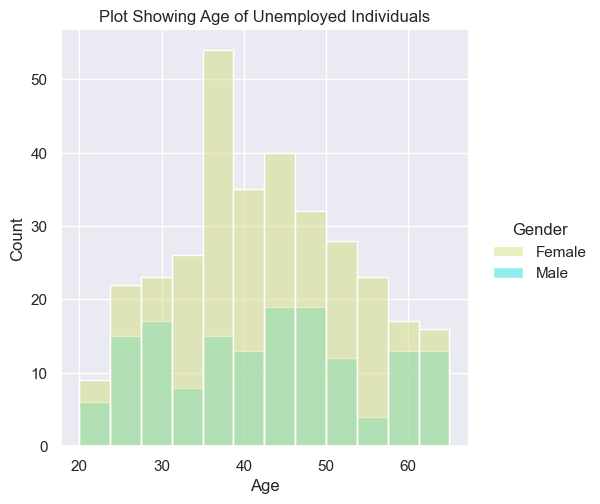

In [123]:
sns.displot(data=unemployment_df, x = 'Age', hue = 'Gender',palette="rainbow_r")
plt.title("Plot Showing Age of Unemployed Individuals");

In [124]:
# Calculating Unemployment rate.

# Number of unemployed individuals.

unemployed_no = len(census_df[census_df["Employment_Class"] == "Unemployed"])

# Number of individuals who employed and unemployed.

no_workforce = len(census_df[(census_df["Employment_Class"] == "Employed") | (census_df["Employment_Class"] == "Unemployed")])

# Calculating unemployment rate.

unemployment_rate = round((unemployed_no / no_workforce) * 100, 2)

print(f"Unemployment rate in the town is {unemployment_rate}%")

Unemployment rate in the town is 9.28%


## Analyzing Occupancy Level

In [126]:
house_occupancy_df = census_df.groupby(['House Number', 'Street']).size().reset_index(name='Occupants Per House')
house_occupancy_df

,House Number,Street,Occupants Per House
0,1,Aberdeen Knolls,2
1,1,Aethelstan Pass,2
2,1,Ahmed Haven,3
3,1,Albans Crescent,4
4,1,Allen Drive,3
5,1,Baker Warehouse,4
6,1,Barlow Pike,4
7,1,Bennett Squares,3
8,1,Bishop Lane,4
9,1,Bishop Tunnel,5


In [127]:
house_occupancy_df['House Address'] = house_occupancy_df['House Number'].astype(str)+ ' ' + house_occupancy_df['Street']

In [128]:
densed_occupancy_df = house_occupancy_df.nlargest(n=20, columns=['Occupants Per House'])

In [129]:
#Top ten overused house
densed_occupancy_df.head(10)


,House Number,Street,Occupants Per House,House Address
329,4,Minster Road,17,4 Minster Road
622,7,Wilson Views,12,7 Wilson Views
667,8,Minster Road,12,8 Minster Road
1107,14,Minster Road,12,14 Minster Road
1660,25,Harvey Dale,12,25 Harvey Dale
1933,32,Harvey Dale,12,32 Harvey Dale
38,1,Iris Castle,11,1 Iris Castle
58,1,Norwich Bastion,11,1 Norwich Bastion
68,1,Reindeer Folly,11,1 Reindeer Folly
367,4,Wilson Views,11,4 Wilson Views


In [130]:
#Top ten under-utilised house
low_occupancy_df = house_occupancy_df.nsmallest(n=20, columns=['Occupants Per House'])

In [131]:
#Creating a new attribute name 'House Address'
low_occupancy_df['House Address'] = low_occupancy_df['House Number'].astype(str) + ' ' + low_occupancy_df['Street']

In [132]:
#Top ten underutilised house
low_occupancy_df.head(10)

,House Number,Street,Occupants Per House,House Address
11,1,Chapman Trace,1,1 Chapman Trace
12,1,Charity Road,1,1 Charity Road
17,1,Coconut Keys,1,1 Coconut Keys
20,1,Davies Rapids,1,1 Davies Rapids
23,1,Dunn Spur,1,1 Dunn Spur
30,1,Gill Hill,1,1 Gill Hill
31,1,Goldfinch Avenue,1,1 Goldfinch Avenue
34,1,Howarth Drive,1,1 Howarth Drive
36,1,Humphreys Farmhouse,1,1 Humphreys Farmhouse
39,1,Iron Point,1,1 Iron Point


In [133]:
# Computing the average occupancy of the houses
avg_occupancy_df = house_occupancy_df['Occupants Per House'].median()
avg_occupancy_df

3.0

In [134]:
#Find the difference between the average occupancy and the number of people who are
#actually living in a given house
house_occupancy_df['Occupancy Difference'] = avg_occupancy_df - house_occupancy_df['Occupants Per House']

In [135]:
house_occupancy_df

,House Number,Street,Occupants Per House,House Address,Occupancy Difference
0,1,Aberdeen Knolls,2,1 Aberdeen Knolls,1.0
1,1,Aethelstan Pass,2,1 Aethelstan Pass,1.0
2,1,Ahmed Haven,3,1 Ahmed Haven,0.0
3,1,Albans Crescent,4,1 Albans Crescent,-1.0
4,1,Allen Drive,3,1 Allen Drive,0.0
5,1,Baker Warehouse,4,1 Baker Warehouse,-1.0
6,1,Barlow Pike,4,1 Barlow Pike,-1.0
7,1,Bennett Squares,3,1 Bennett Squares,0.0
8,1,Bishop Lane,4,1 Bishop Lane,-1.0
9,1,Bishop Tunnel,5,1 Bishop Tunnel,-2.0


In [136]:
no_dense_occupied_houses = house_occupancy_df.loc[(house_occupancy_df['Occupants Per House'] > avg_occupancy_df)].shape[0]
no_dense_occupied_houses

938

In [137]:
#Creating new attribute.
census_df['House Address'] = census_df['House Number'].astype(str)+ ' ' + census_df['Street']

In [138]:
census_df.loc[(census_df['House Address'] == '4 Minster Road') 
                     & (census_df['House Number'] == 4)]

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion,Age Band,Employment_Class,House Address
6755,4,Minster Road,Rachael,Hurst,48,Head,Divorced,Female,Unemployed,None,Christian,45-49,Unemployed,4 Minster Road
6756,4,Minster Road,Joanna,Hurst,16,Daughter,Single,Female,Student,None,Undecided,15-19,Student,4 Minster Road
6757,4,Minster Road,Jasmine,Hurst,13,Daughter,Minor,Female,Student,None,Undecided,10-14,Student,4 Minster Road
6758,4,Minster Road,Aimee,Hurst,10,Daughter,Minor,Female,Student,None,Undecided,10-14,Student,4 Minster Road
6759,4,Minster Road,Gillian,Ellis-Hurst,6,Daughter,Minor,Female,Student,None,Undecided,5-9,Student,4 Minster Road
6760,4,Minster Road,Joyce,Ellis-Hurst,5,Daughter,Minor,Female,Student,None,Undecided,5-9,Student,4 Minster Road
6761,4,Minster Road,Bruce,Ellis-Hurst,5,Son,Minor,Male,Student,None,Undecided,5-9,Student,4 Minster Road
6762,4,Minster Road,Amy,Ellis-Hurst,1,Daughter,Minor,Female,Child,None,Undecided,0-4,Child,4 Minster Road
6763,4,Minster Road,Leigh,Ellis-Hurst,0,Son,Minor,Male,Child,None,Undecided,0-4,Child,4 Minster Road
6764,4,Minster Road,Angela,Phillips,60,Lodger,Single,Female,Financial risk analyst,None,No Religion,60-64,Employed,4 Minster Road


In [139]:
lodgers_stat = census_df[census_df['Relationship to Head of House'] == 'Lodger'].groupby('House Address')['Surname'].nunique()
print("No of households with lodgers living with them:", len(lodgers_stat))

No of households with lodgers living with them: 390


## Birth Rate

In [140]:
#Computing the current birth rate 
no_babies = census_df[census_df["Age"].between(0, 1)]["Age"].count()
#obtaining the number of women aged 18-45 would have given birth to the babies aged 0-1
#https://www.ons.gov.uk/peoplepopulationandcommunity/birthsdeathsandmarriages/conceptionandfertilityrates
no_mothers_babies = census_df[census_df["Age"].between(18, 45)]["Age"].count()
current_birthrate =  round((no_babies/no_mothers_babies)*100000)
print( f"Current birth rate per 100000: {current_birthrate}" )

Current birth rate per 100000: 4565


In [141]:
#Computing the birth rate five years ago
no_babies_5years_ago = census_df[census_df["Age"].between(5, 6)]["Age"].count()
#obtaining the number of women aged 23-50 would have given birth to the babies aged 5-6
no_mothers_babies_5years_ago = census_df[census_df["Age"].between(23, 50)]["Age"].count()
birth_rate_5years_ago =  round((no_babies_5years_ago/no_mothers_babies_5years_ago)*100000)
print( f"The birth rate per 100000 five years ago is : {birth_rate_5years_ago}" )

The birth rate per 100000 five years ago is : 6917


In [142]:
#Computing the birth rate 10 years ago
no_babies_10years_ago = census_df[census_df["Age"].between(10, 11)]["Age"].count()
#obtaining the number of women aged 28-55 would have given birth to the babies aged 10-11
no_mothers_babies_10years_ago = census_df[census_df["Age"].between(28, 55)]["Age"].count()
birth_rate_10years_ago =  round((no_babies_10years_ago/no_mothers_babies_10years_ago)*100000)
print( f"The birth rate per 100000 ten years ago is : {birth_rate_10years_ago}" )

The birth rate per 100000 ten years ago is : 7356


In [143]:
#Computing the birth rate 15 years ago
no_babies_15years_ago = census_df[census_df["Age"].between(15, 16)]["Age"].count()
#obtaining the number of women aged 33-58 would have given birth to the babies aged 15-16
no_mothers_babies_15years_ago = census_df[census_df["Age"].between(33, 58)]["Age"].count()
birth_rate_15years_ago =  round((no_babies_15years_ago/no_mothers_babies_15years_ago)*100000)
print( f"The birth rate per 100000 fifteen years ago is : {birth_rate_15years_ago}" )

The birth rate per 100000 fifteen years ago is : 7634


In [144]:
#Computing the birth rate 20 years ago
no_babies_20years_ago = census_df[census_df["Age"].between(20, 25)]["Age"].count()
#obtaining the number of women aged 38-63 would have given birth to the babies aged 20-25
no_mothers_babies_20years_ago = census_df[census_df["Age"].between(38, 63)]["Age"].count()
birth_rate_20years_ago =  round((no_babies_20years_ago/no_mothers_babies_20years_ago)*100000)
print( f"The birth rate per 100000 twenty years ago is : {birth_rate_20years_ago}" )

The birth rate per 100000 twenty years ago is : 24369


In [145]:
# Define some data
birth_rate_list = {
        'Year': [0, 5, 10, 15, 20],
        'Birth Rate': [current_birthrate, birth_rate_5years_ago, birth_rate_10years_ago, birth_rate_15years_ago, birth_rate_20years_ago]}
# Create the DataFrame
birth_rate_df = pd.DataFrame(birth_rate_list)
birth_rate_df

,Year,Birth Rate
0,0,4565
1,5,6917
2,10,7356
3,15,7634
4,20,24369


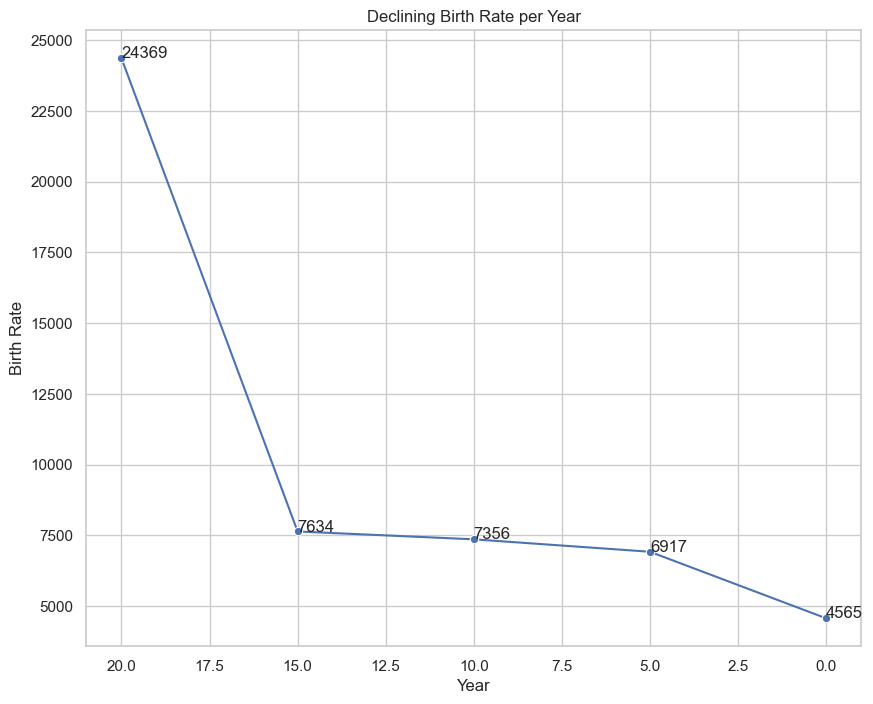

In [162]:
sns.set_style("whitegrid")
sns.lineplot(x="Year", y="Birth Rate", data=birth_rate_df, marker="o")

for index, row in birth_rate_df.iterrows():
    plt.text(row['Year'], row['Birth Rate'], str(row['Birth Rate']))

# Show the plot
plt.gca().set_xlim(plt.gca().get_xlim()[::-1])
plt.title("Declining Birth Rate per Year")
plt.savefig('birthrate.png')
plt.show()

In [147]:
#crude_birth_rate per100000 = number of births/Total Population*100000
crude_birth_rate= round((no_babies/census_df['Age'].count())*100000)
crude_birth_rate

1994

## Death Rate

In [148]:
#get life expectancy age
#https://www.ons.gov.uk/peoplepopulationandcommunity/birthsdeathsandmarriages/lifeexpectancies/bulletins/nationallifetablesunitedkingdom/2018to2020
exp_age_65above = ageclass[:9]
exp_age_65above

['105+',
 '100-104',
 '95-99',
 '90-94',
 '85-89',
 '80-84',
 '75-79',
 '70-74',
 '65-69']

In [149]:
population_estimate = census_df.shape[0]
ageBandStartIndex = 0
ageBandEndIndex = 2
ageband_death_diff__list = []
deaths_per_year_list = []
age_band_list = []
for age_groups in range(round(len(exp_age_65above)/2)):
    #print(age_class_above_sixty[ageBandStartIndex:ageBandEndIndex])
    age_band_list.append(exp_age_65above[ageBandStartIndex:ageBandEndIndex])
    ageBandStartIndex = ageBandStartIndex+ 2
    ageBandEndIndex = ageBandEndIndex+ 2
#print(age_band_list)
for age_band in age_band_list:
    ageband_death_diff__list.append((round(census_df[census_df['Age Band'] 
                                                               == age_band[1]]['Age Band'].count())
                                        - round(census_df[census_df['Age Band'] 
                                                                 == age_band[0]]['Age Band'].count()))/5)  
print(f"Death rate differential between older and younger group : {ageband_death_diff__list}")
death_estimation = round((sum(ageband_death_diff__list)))
print( f"The total death rate across all age groups in age_class_above_sixty is : {death_estimation}" )

Death rate differential between older and younger group : [1.2, 2.0, 13.8, 17.0]
The total death rate across all age groups in age_class_above_sixty is : 34


In [150]:
crude_death_rate = round((death_estimation/population_estimate)*100000)
crude_death_rate

396

## Analyzing Immigration and Emigration

In [151]:
#Getting the number of possible immigrants
no_single_immigrants =census_df.loc[(census_df['Relationship to Head of House'] == 'Visitor') 
                   | (census_df['Relationship to Head of House'] == 'Lodger')
                   & (census_df['Marital Status'] == 'Single')
                   &(census_df['Age'] < 65)]['Relationship to Head of House'].count()
no_single_immigrants = round(no_single_immigrants/census_df['Relationship to Head of House'].count() *100000)
no_single_immigrants
print( f"The number of immigration per hundred thousand  : {no_single_immigrants}" )

The number of immigration per hundred thousand  : 8896


In [152]:
#Getting the count of divorced males
#Getting the number of possible immigrants
no_male_divorcees =census_df.loc[(census_df['Relationship to Head of House'] == 'Visitor') 
                   | (census_df['Relationship to Head of House'] == 'Lodger')
                   & (census_df['Marital Status'] == 'Divorced')
                   & (census_df['Gender'] == 'Male')
                   &(census_df['Age'] < 65)]['Relationship to Head of House'].count()
no_male_divorcees = round(no_male_divorcees/census_df['Relationship to Head of House'].count() *100000)
no_male_divorcees
print( f"The number of emigrated males per hundred thousand is : {no_male_divorcees}" )

The number of emigrated males per hundred thousand is : 735


In [153]:
#Getting the count of divorced males
#Getting the number of possible immigrants
no_female_divorcees =census_df.loc[(census_df['Relationship to Head of House'] == 'Visitor') 
                   | (census_df['Relationship to Head of House'] == 'Lodger')
                   & (census_df['Marital Status'] == 'Divorced')
                   & (census_df['Gender'] == 'Female')
                   &(census_df['Age'] < 65)]['Relationship to Head of House'].count()
no_female_divorcees = round(no_female_divorcees/census_df['Relationship to Head of House'].count() *100000)
no_female_divorcees
print( f"The number of emigrated females per hundred thousand is : {no_female_divorcees}" )

The number of emigrated females per hundred thousand is : 676


In [154]:
#There are more divorced male than female hence we can say that that some of the male divorcee has left the town
no_emigrant = ((no_male_divorcees - no_female_divorcees)/(census_df.shape[0]))*100000
print( f"The number of emigrants per hundred thousand of the population is : {round(no_emigrant)}" )

The number of emigrants per hundred thousand of the population is : 688


## Examining the Divorce and Marriage Rate

In [155]:
no_marriages = census_df[census_df['Marital Status'] == 'Married']['Marital Status'].count()

In [156]:
#crude marriage rate = (number of marriages/mid-year population) * 100000
mid_year_population = census_df.shape[0]/2
crude_marriage_rate = round((no_marriages/mid_year_population)* 100000)
print( f"The crude marriage rate per hundred thousand people is : {(crude_marriage_rate)}" )

The crude marriage rate per hundred thousand people is : 60674


In [157]:
#computing the crude divorce rate
#crude marriage rate = (number of divorces/mid-year population) * 100000
no_divorce = census_df[census_df['Marital Status'] == 'Divorced']['Marital Status'].count()
crude_divorce_rate = round((no_divorce/mid_year_population)* 100000)
print( f"The crude divorce rate per hundred thousand people is : {(crude_divorce_rate)}" )

The crude divorce rate per hundred thousand people is : 17559
